# 01 LT preprocessing - all treatments

QC, filter and cluster LT HSCs

Run with this command in docker container

docker run 
--rm 
-d 
--name demuxEM 
-p 8881:8888 
-e JUPYTER_ENABLE_LAB=YES 
-v /Users/efast/Documents/:/home/jovyan/work 
pegasuspy_scanpy:vs1


adapted from this best practice example:
https://github.com/theislab/single-cell-tutorial/blob/master/latest_notebook/Case-study_Mouse-intestinal-epithelium_1906.ipynb

# 1) Loading packages + data

In [1]:
%reset

Once deleted, variables cannot be recovered. Proceed (y/[n])?  y


In [2]:
%matplotlib inline

import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import scanpy.external as sce
import seaborn as sb

sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)

In [3]:
sc.settings.set_figure_params(dpi=80)

In [4]:
plt.rcParams['figure.figsize']=(8,8) #rescale figures

In [5]:
# Set up data loading

#Data files
sample_strings = ['ct', 'dmPGE2', 'GCSF', 'indo', 'pIC']
sample_id_strings = ['A_ct', 'A_dmPGE2', 'A_GCSF', 'A_indo', 'A_pIC']

file_base = './raw_data/'
file_end = '/outs/filtered_feature_bc_matrix'

In [6]:
# First data set load & annotation
#Parse Filenames
sample = sample_strings.pop(0) # this pops out the first element of the list sample_strings = ct
sample_id = sample_id_strings.pop(0) # this pops out the first element of the list sample_id_strings = 1
data_file = file_base+sample_id+file_end # assembles the name of the datafile

#Load data
adata = sc.read_10x_mtx(data_file, var_names='gene_symbols', cache=True)

#Annotate data
adata.obs['sample'] = [sample]*adata.n_obs #this multiplies ct*the number of adata.n_obs and adds it into the adata.obs df

... reading from cache file cache/raw_data-A_ct-outs-filtered_feature_bc_matrix-matrix.h5ad


In [7]:
# Loop to load rest of data sets
for i in range(len(sample_strings)):
    #Parse Filenames
    sample = sample_strings[i] # this pops out the first element of the list sample_strings = ct
    sample_id = sample_id_strings[i] # this pops out the first element of the list sample_id_strings = 1
    data_file = file_base+sample_id+file_end # assembles the name of the datafile
     
    #Load data
    adata_tmp = sc.read_10x_mtx(data_file, var_names='gene_symbols', cache=True)
    
    #Annotate data
    adata_tmp.obs['sample'] = [sample]*adata_tmp.n_obs

    adata_tmp.var_names_make_unique()

    # Concatenate to main adata object
    adata = adata.concatenate(adata_tmp, batch_key='sample_id') #batch_key is identifying the sample
    adata.obs.drop(columns=['sample_id'], inplace=True) #drops the ID - the number
    adata.obs_names = [c.split("-")[0] for c in adata.obs_names] #adata.obs_names accesses the index of adata.obs = the barcodes
    # this removes the "-1"
    adata.obs_names_make_unique(join='_') #makes the cell barcodes unique

... reading from cache file cache/raw_data-A_dmPGE2-outs-filtered_feature_bc_matrix-matrix.h5ad
... reading from cache file cache/raw_data-A_GCSF-outs-filtered_feature_bc_matrix-matrix.h5ad
... reading from cache file cache/raw_data-A_indo-outs-filtered_feature_bc_matrix-matrix.h5ad
... reading from cache file cache/raw_data-A_pIC-outs-filtered_feature_bc_matrix-matrix.h5ad


In [8]:
adata.var = adata.var.iloc[:, 0:1] # deleted the multiple gene IDs

In [9]:
# Annotate the data sets
print(adata.obs['sample'].value_counts())
print('')

ct        6111
indo      5940
GCSF      3246
pIC        932
dmPGE2     650
Name: sample, dtype: int64



In [10]:
adata

AnnData object with n_obs × n_vars = 16879 × 31053 
    obs: 'sample'
    var: 'gene_ids'

# 2) Pre-processing and visualization

In [11]:
# Quality control - calculate QC covariates
adata.obs['n_counts'] = adata.X.sum(1)
adata.obs['log_counts'] = np.log(adata.obs['n_counts'])
adata.obs['n_genes'] = (adata.X > 0).sum(1)

In [12]:
# create metacolums in adata.obs for percentage mitochondrial counts and total counts/gene
mito_genes = adata.var_names.str.startswith('mt-')

In [13]:
# add the percent mitochondria to the adata.obs
adata.obs['percent_mito'] = np.sum(
    adata[:, mito_genes].X, axis=1) / np.sum(adata.X, axis=1)

(array([8.205e+03, 4.750e+02, 6.650e+02, 1.440e+03, 1.113e+03, 1.483e+03,
        1.179e+03, 5.590e+02, 5.920e+02, 2.690e+02, 2.610e+02, 1.510e+02,
        1.500e+02, 1.020e+02, 5.200e+01, 4.900e+01, 2.200e+01, 3.300e+01,
        1.900e+01, 1.100e+01, 1.300e+01, 1.000e+01, 4.000e+00, 3.000e+00,
        7.000e+00, 3.000e+00, 2.000e+00, 2.000e+00, 0.000e+00, 1.000e+00,
        2.000e+00, 0.000e+00, 1.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 1.000e+00]),
 array([  0.  ,   2.58,   5.16,   7.74,  10.32,  12.9 ,  15.48,  18.06,
         20.64,  23.22,  25.8 ,  28.38,  30.96,  33.54,  36.12,  38.7 ,
         41.28,  43.86,  46.44,  49.02,  51.6 ,  54.18,  56.76,  59.34,
         61.92,  64.5 ,  67.08,  69.66,  72.24,  74.82,  77.4 ,  79.98,
         82.56,  85.14,  87.72,  90.3 ,  92.88,  95.46,  98.04, 100.62,
        103.2 , 

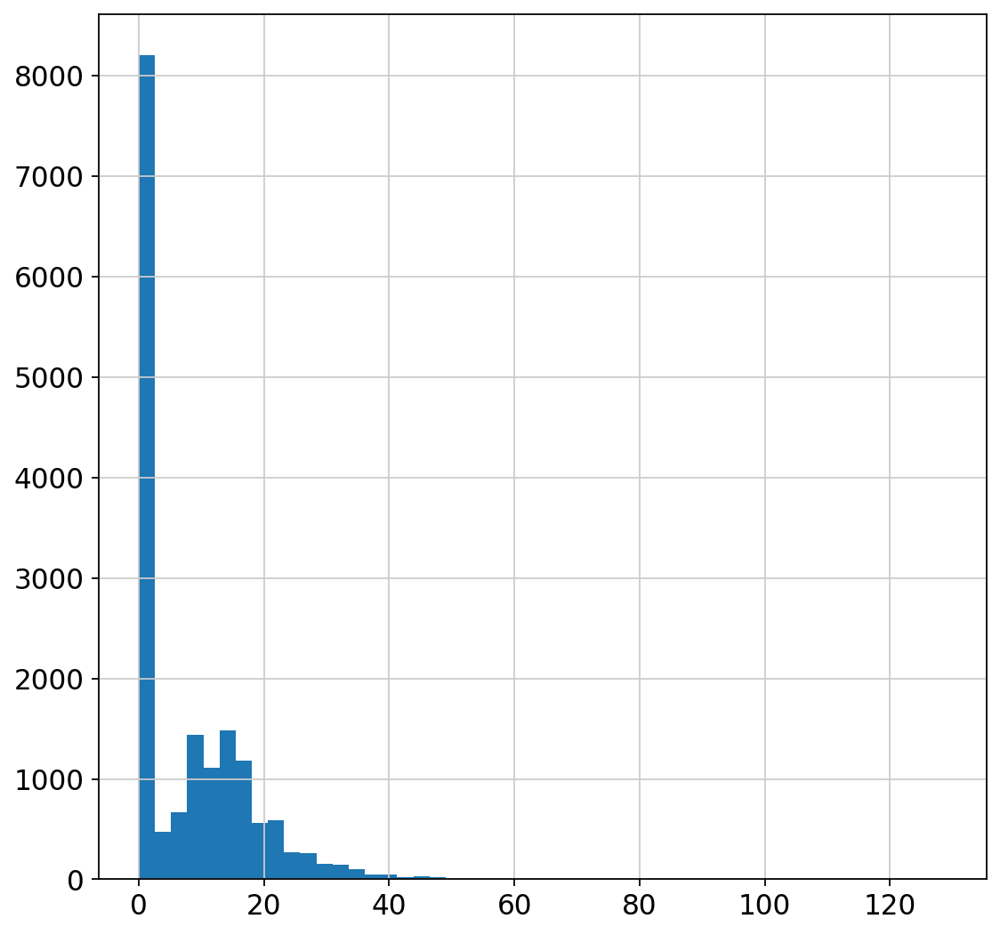

In [14]:
plt.hist(adata[: , 'Xist'].X.toarray(), bins=50)

In [15]:
# add in the Xist metadata to the adata.obs

adata.obs['Female'] = adata[: , 'Xist'].X.toarray() > 0 # make a column in adata.obs to identify female cells
adata.obs['Female_cat']=adata.obs['Female'].astype('category', copy=True) # make a column with category as dtype

In [16]:
### Make a metacolumn that stores male and female cells

adata.obs['Female_str'] = adata.obs['Female'].map(lambda x: str(x).lower() if isinstance(x, bool) else  x)
adata.obs['sex_sample'] = adata.obs['sample'].str.cat(others = adata.obs['Female_str'], sep='_')
adata.obs['sex_sample']=adata.obs['sex_sample'].astype('category', copy=True) # make a column with category as dtype

In [17]:
# make a metacolumn that sto
adata.obs['sex_sample'].value_counts()

ct_true         3467
indo_false      3080
indo_true       2860
ct_false        2644
GCSF_true       2048
GCSF_false      1198
dmPGE2_false     523
pIC_true         509
pIC_false        423
dmPGE2_true      127
Name: sex_sample, dtype: int64

In [18]:
plt.rcParams['figure.figsize']=(12,8) #rescale figures

... storing 'sample' as categorical
... storing 'Female_str' as categorical


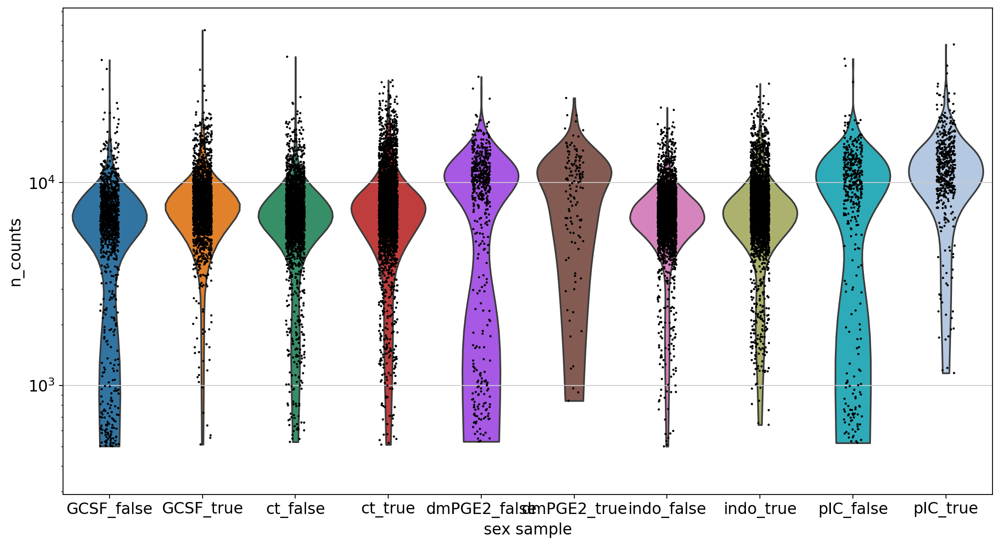

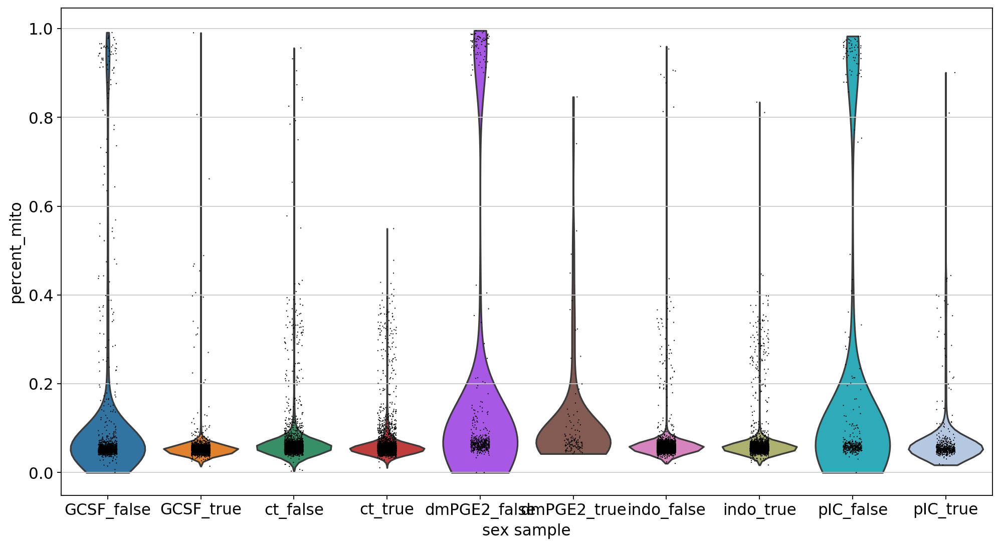

In [19]:
# Quality control - plot QC metrics
#Sample quality plots
t1 = sc.pl.violin(adata, 'n_counts', groupby='sex_sample', size=2, log=True, cut=0)
t2 = sc.pl.violin(adata, 'percent_mito', groupby='sex_sample')

looks like the sequencing depth and the amount of dead cells is pretty similar - interesting trend that male cells tend to have higher mito count - more dead cells?

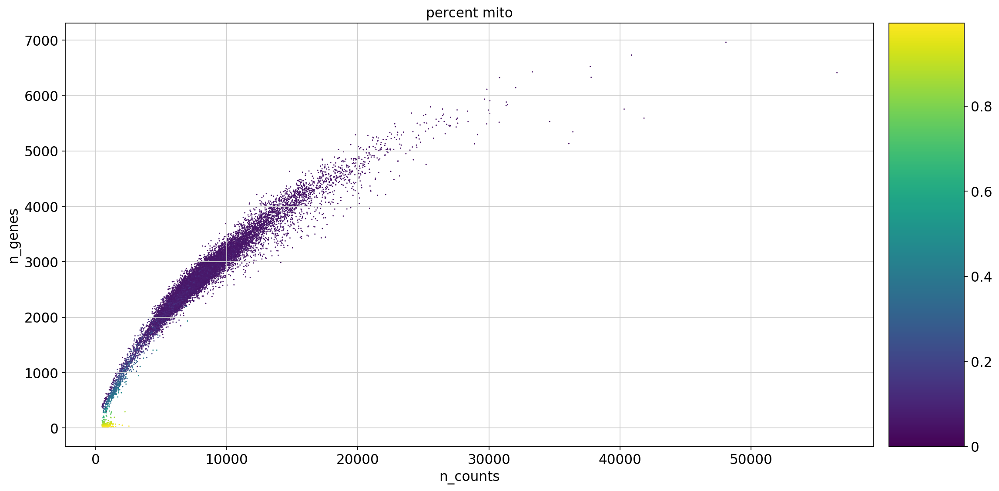

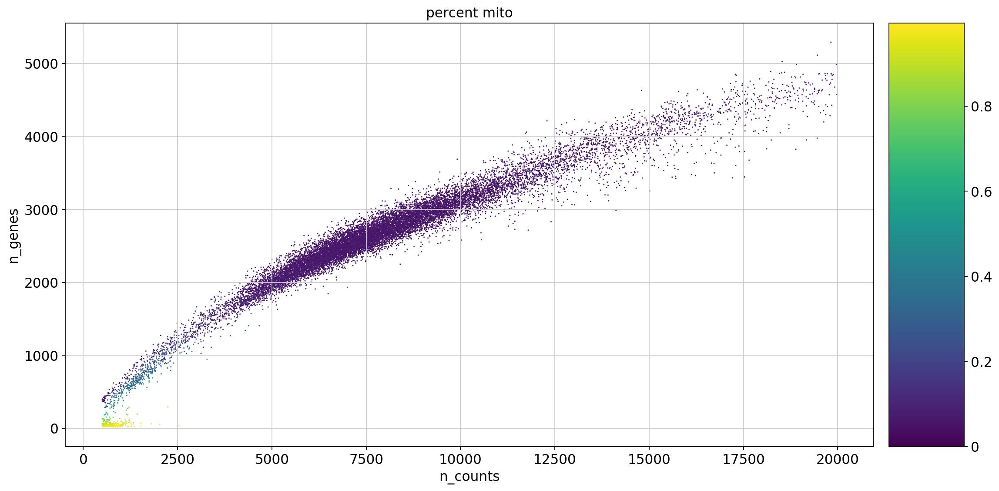

In [20]:
#Data quality summary plots
p1 = sc.pl.scatter(adata, 'n_counts', 'n_genes', color='percent_mito')
p2 = sc.pl.scatter(adata[adata.obs['n_counts']<20000], 'n_counts', 'n_genes', color='percent_mito')

the cells that have really high n_counts also have not many genes - so these cells are likely dead

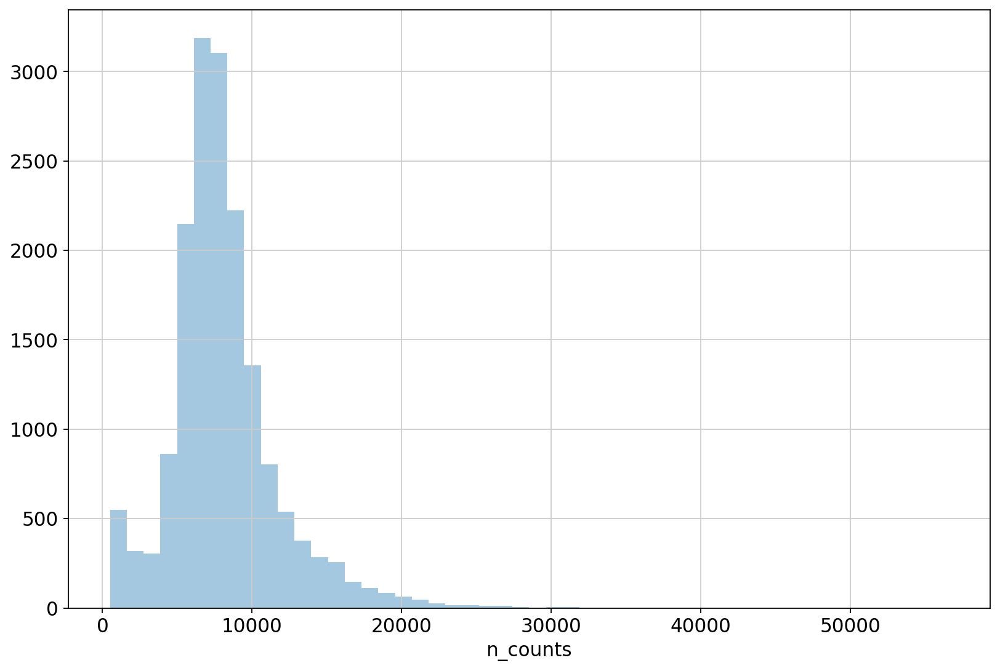

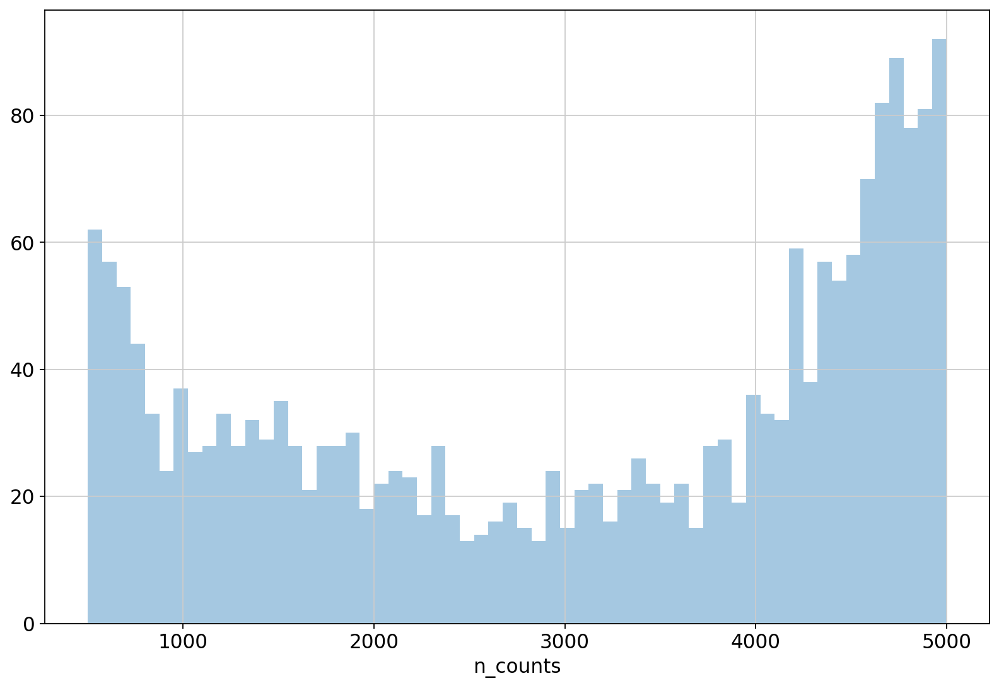

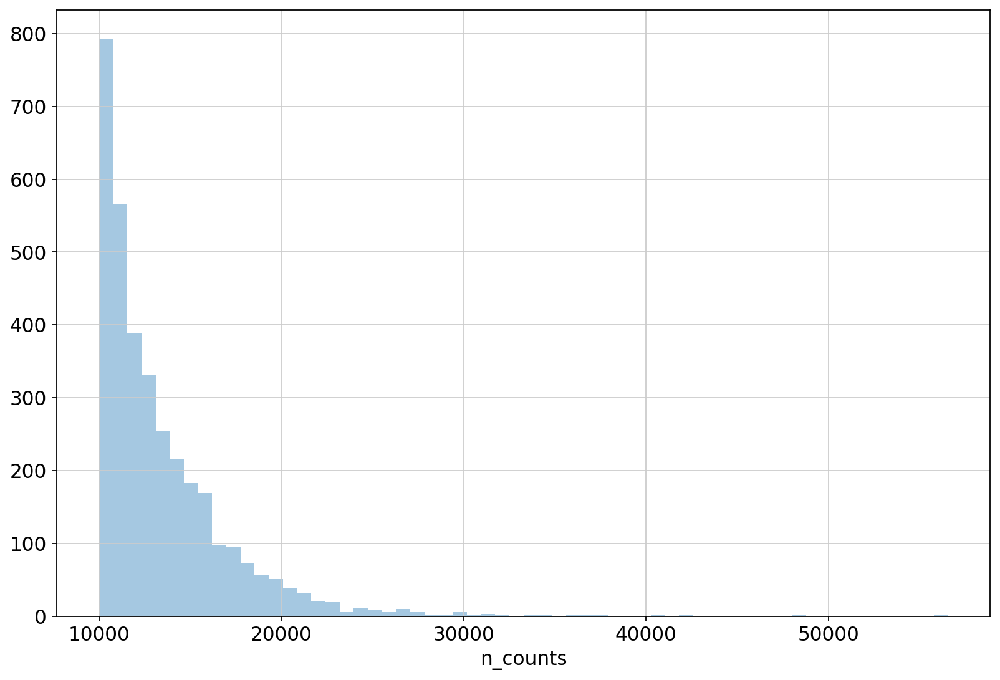

In [21]:
#Thresholding decision: counts
p3 = sb.distplot(adata.obs['n_counts'], kde=False)
plt.show()

p4 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']<5000], kde=False, bins=60)
plt.show()

p5 = sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']>10000], kde=False, bins=60)
plt.show()

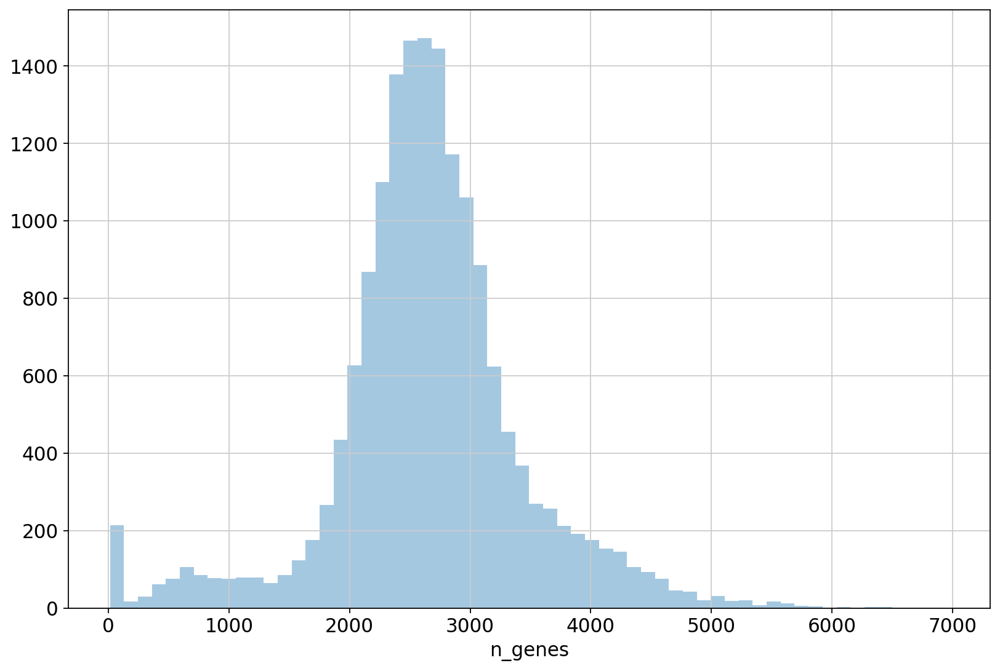

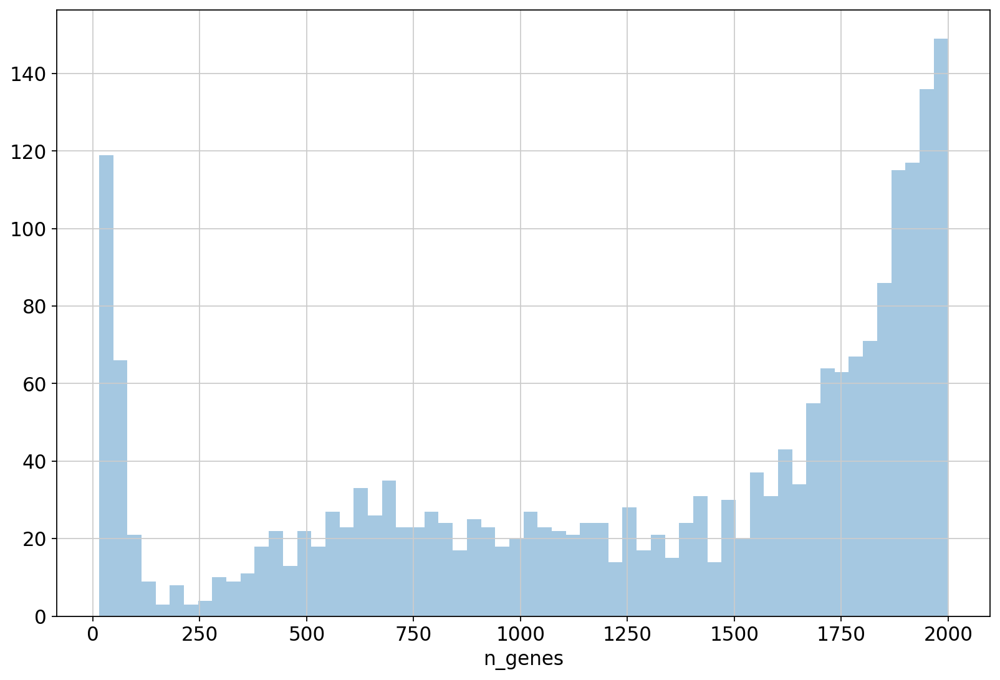

In [22]:
#Thresholding decision: genes
p6 = sb.distplot(adata.obs['n_genes'], kde=False, bins=60)
plt.show()

p7 = sb.distplot(adata.obs['n_genes'][adata.obs['n_genes']<2000], kde=False, bins=60)
plt.show()


In [23]:
# Filter cells according to identified QC thresholds:
# leave filtering criteria relatively loose - can be made more stringent later

print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, min_counts = 3000)
print('Number of cells after min count filter: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, max_counts = 20000)
print('Number of cells after max count filter: {:d}'.format(adata.n_obs))

adata = adata[adata.obs['percent_mito'] < 0.1]
print('Number of cells after MT filter: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, min_genes = 1500)
print('Number of cells after gene filter: {:d}'.format(adata.n_obs))




Total number of cells: 16879
filtered out 925 cells that have less than 3000 counts
Number of cells after min count filter: 15954
filtered out 193 cells that have more than 20000 counts
Number of cells after max count filter: 15761
Number of cells after MT filter: 15403
filtered out 48 cells that have less than 1500 genes expressed


Trying to set attribute `.obs` of view, copying.


Number of cells after gene filter: 15355


In [24]:
# Filter out genes that are expressed in very few cells

#Filter genes:
print('Total number of genes: {:d}'.format(adata.n_vars))

# Min 20 cells - filters out 0 count genes
sc.pp.filter_genes(adata, min_cells=20)
print('Number of genes after cell filter: {:d}'.format(adata.n_vars))

Total number of genes: 31053
filtered out 16645 genes that are detected in less than 20 cells
Number of genes after cell filter: 14408


In [25]:
# normalize to 10K counts/cell and logtransform
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
sc.pp.log1p(adata)

normalizing by total count per cell
    finished (0:00:01): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


In [26]:
adata.raw = adata

In [27]:
adata

AnnData object with n_obs × n_vars = 15355 × 14408 
    obs: 'sample', 'n_counts', 'log_counts', 'n_genes', 'percent_mito', 'Female', 'Female_cat', 'Female_str', 'sex_sample'
    var: 'gene_ids', 'n_cells'
    uns: 'sex_sample_colors', 'log1p'

## 2.2 Batch correction

In [28]:
# make a new column with identifying the batches
adata.obs['batch'] = adata.obs['sample']

adata.obs['batch'] = adata.obs['batch'].apply(lambda x: 'batch1' if x == 'ct' else x)
adata.obs['batch'] = adata.obs['batch'].apply(lambda x: 'batch1' if x == 'indo' else x)
adata.obs['batch'] = adata.obs['batch'].apply(lambda x: 'batch2' if x == 'dmPGE2' else x)
adata.obs['batch'] = adata.obs['batch'].apply(lambda x: 'batch2' if x == 'pIC' else x)
adata.obs['batch'] = adata.obs['batch'].apply(lambda x: 'batch3' if x == 'GCSF' else x)

In [29]:
# ComBat batch correction
sc.pp.combat(adata, key='batch')

... storing 'batch' as categorical


Standardizing Data across genes.

Found 3 batches

Found 0 numerical variables:
	

Fitting L/S model and finding priors

Finding parametric adjustments



/opt/conda/lib/python3.7/site-packages/scanpy/preprocessing/_combat.py:338: RuntimeWarning: divide by zero encountered in true_divide
  change = max((abs(g_new - g_old) / g_old).max(), (abs(d_new - d_old) / d_old).max())


Adjusting data



(array([1.008e+03, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 5.368e+03,
        4.000e+00, 7.030e+02, 3.000e+00, 6.000e+00, 1.000e+01, 1.200e+01,
        2.400e+01, 4.500e+01, 5.600e+01, 3.900e+01, 2.500e+01, 6.000e+00,
        1.100e+01, 1.900e+01, 1.900e+01, 2.500e+01, 4.100e+01, 5.000e+01,
        5.600e+01, 9.600e+01, 1.410e+02, 1.530e+02, 2.450e+02, 2.850e+02,
        3.450e+02, 4.700e+02, 5.830e+02, 6.550e+02, 7.170e+02, 7.360e+02,
        7.520e+02, 7.380e+02, 5.890e+02, 5.100e+02, 3.260e+02, 2.010e+02,
        1.170e+02, 7.600e+01, 4.600e+01, 2.600e+01, 9.000e+00, 6.000e+00,
        2.000e+00, 1.000e+00]),
 array([-0.41239647, -0.31940344, -0.2264104 , -0.13341737, -0.04042433,
         0.0525687 ,  0.14556174,  0.23855477,  0.3315478 ,  0.42454084,
         0.51753387,  0.61052691,  0.70351994,  0.79651298,  0.88950601,
         0.98249905,  1.07549208,  1.16848511,  1.26147815,  1.35447118,
         1.44746422,  1.54045725,  1.63345029,  1.72644332,  1.81943636,
         1.

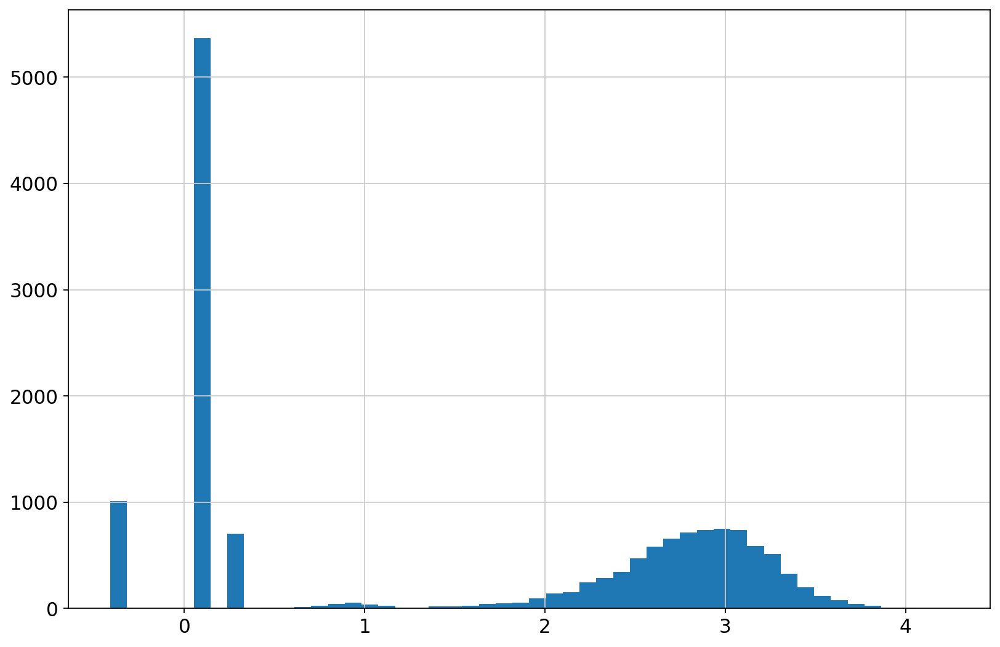

In [30]:
plt.hist(adata[: , 'Xist'].X.toarray(), bins=50)

In [31]:
#make column in adata.obs with corrected Xist

adata.obs['rXist'] = adata[: , 'Xist'].X.toarray() + 0.01 # make a column in adata.obs that stores the actual values of Xist, add 0.01 to get rid of "0" for downstream processin 

#regresses out Xist from adata 
sc.pp.regress_out(adata, ['rXist'])

regressing out ['rXist']


/opt/conda/lib/python3.7/site-packages/statsmodels/compat/pandas.py:23: FutureWarning: The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version
  data_klasses = (pandas.Series, pandas.DataFrame, pandas.Panel)


    finished (0:03:02)


# 3) Select variable genes for downstream analysis

In [32]:
sc.pp.highly_variable_genes(adata, flavor='cell_ranger', n_top_genes=2500)
print('\n','Number of highly variable genes: {:d}'.format(np.sum(adata.var['highly_variable'])))

extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)

 Number of highly variable genes: 2500


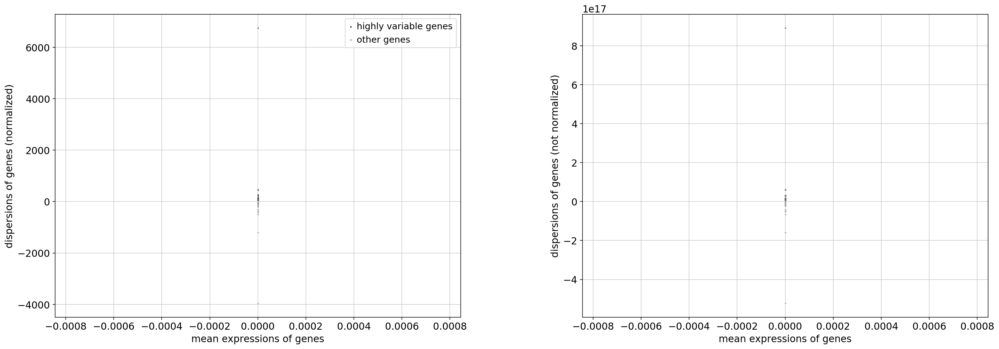

In [33]:
sc.pl.highly_variable_genes(adata)

In [34]:
adata #this now only contains the most variable genes

AnnData object with n_obs × n_vars = 15355 × 14408 
    obs: 'sample', 'n_counts', 'log_counts', 'n_genes', 'percent_mito', 'Female', 'Female_cat', 'Female_str', 'sex_sample', 'batch', 'rXist'
    var: 'gene_ids', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'sex_sample_colors', 'log1p'

In [35]:
#Scale data 
sc.pp.scale(adata, max_value=10)

# Calculate best clustering combination

In [36]:
# run PCA
sc.pp.pca(adata, n_comps=50, use_highly_variable=True, svd_solver='arpack')

computing PCA with n_comps = 50
    on highly variable genes
    finished (0:00:14)


In [37]:
## make loop to save different silhouette scores and Davies Bouldin scores in a dataframe

from __future__ import print_function
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.metrics import davies_bouldin_score
from tqdm import tnrange, tqdm_notebook
from time import sleep
import warnings


sc.settings.verbosity = 0   ### suppress output of scanpy
warnings.filterwarnings('ignore') # suppress Warnings
results_df=[]
results_df = pd.DataFrame(columns=['KNN', 'resolution','number_of_clusters', 'sil', 'davie_bould'])

for k in tnrange(5, 50, 5, desc ='1st loop'):
    sc.pp.neighbors(adata, n_neighbors=k, n_pcs=40);
    sc.tl.umap(adata);
    
    for i in tqdm_notebook(range(20, 100, 10), desc ='2nd loop', leave=False):
        j = i/100
        sc.tl.leiden(adata, resolution=j);
        sc.tl.rank_genes_groups(adata, 'leiden')
        silhouette_avg = silhouette_score(adata.obsm['X_pca'], adata.obs['leiden'])
        davies_bouldin_avg = davies_bouldin_score(adata.obsm['X_pca'], adata.obs['leiden'])
        results_df = results_df.append(pd.DataFrame([[k, j, max(adata.obs['leiden']), silhouette_avg, davies_bouldin_avg]], columns=['KNN', 'resolution','number_of_clusters', 'sil', 'davie_bould']))
        sleep(0.01)

In [ ]:
results_df['number_of_clusters'] = results_df['number_of_clusters'].astype(float) + 1 
# need to change the object type louvain clusters are saved as object not float
# need to add 1 because it python starts counting at 0 and the total number of clusters is 1 + max

results_df

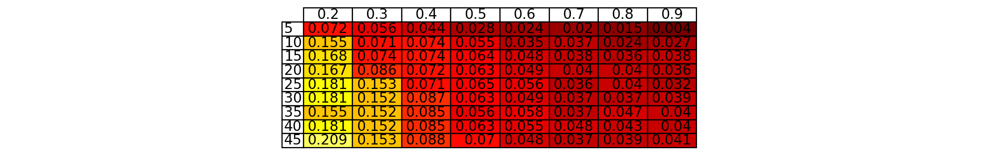

In [39]:
# Make a colored table with the silhouette scores
piv_sil = results_df.pivot(index='KNN', columns='resolution', values='sil')
vals = np.around(piv_sil.values,3) #evenly round to the given number of decimals.

norm = plt.Normalize(vals.min()-0.05, vals.max()+0.05)
colours = plt.cm.hot(norm(vals))

fig = plt.figure(figsize=(15,8))
ax = fig.add_subplot(411, frameon=False, xticks=[], yticks=[])

the_table=plt.table(cellText=vals, rowLabels=piv_sil.index, colLabels=piv_sil.columns, 
                    colWidths = [0.05]*vals.shape[1], loc='center', 
                    cellColours=colours)
plt.show()

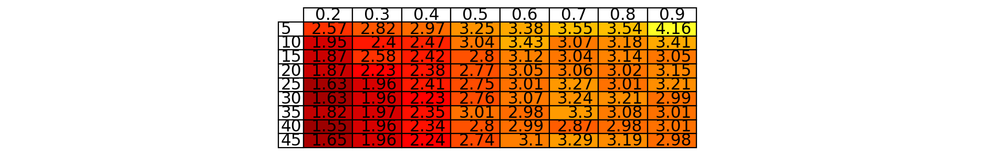

In [40]:
# Make a colored table with the Davies Bouldin scores
piv_DB = results_df.pivot(index='KNN', columns='resolution', values='davie_bould')

vals = np.around(piv_DB.values,2) #evenly round to the given number of decimals.

norm = plt.Normalize(vals.min()-1, vals.max()+1)
colours = plt.cm.hot(norm(vals))


fig = plt.figure(figsize=(15,8))
ax = fig.add_subplot(411, frameon=False, xticks=[], yticks=[])

the_table=plt.table(cellText=vals, rowLabels=piv_DB.index, colLabels=piv_DB.columns, 
                    colWidths = [0.05]*vals.shape[1], loc='center', 
                    cellColours=colours)


plt.show()

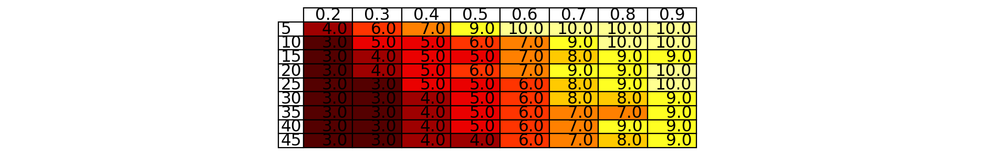

In [41]:
# Make a colored table with the number of clusters
piv_clust = results_df.pivot(index='KNN', columns='resolution', values='number_of_clusters')

vals = np.around(piv_clust.values,2) #evenly round to the given number of decimals.

norm = plt.Normalize(vals.min()-1, vals.max()+1)
colours = plt.cm.hot(norm(vals))


fig = plt.figure(figsize=(15,8))
ax = fig.add_subplot(411, frameon=False, xticks=[], yticks=[])

the_table=plt.table(cellText=vals, rowLabels=piv_clust.index, colLabels=piv_clust.columns, 
                    colWidths = [0.05]*vals.shape[1], loc='center', 
                    cellColours=colours)


plt.show()

In [42]:
max_sil = results_df[results_df.groupby('number_of_clusters')['sil'].transform('max') == results_df['sil']].sort_values(by=['number_of_clusters'])
max_sil

,KNN,resolution,number_of_clusters,sil,davie_bould
0,45,0.2,3.0,0.208733,1.645750
0,45,0.4,4.0,0.087646,2.235226
0,15,0.4,5.0,0.074362,2.416436
0,20,0.5,6.0,0.062719,2.768932
0,20,0.6,7.0,0.049270,3.049155
0,45,0.8,8.0,0.039083,3.185866
0,40,0.8,9.0,0.042635,2.980729
0,20,0.9,10.0,0.036123,3.147801


In [43]:
min_db = results_df[results_df.groupby('number_of_clusters')['davie_bould'].transform('min') == results_df['davie_bould']].sort_values(by=['number_of_clusters'])
min_db

,KNN,resolution,number_of_clusters,sil,davie_bould
0,40,0.2,3.0,0.180904,1.548025
0,30,0.4,4.0,0.086775,2.226292
0,20,0.4,5.0,0.071857,2.375440
0,20,0.5,6.0,0.062719,2.768932
0,40,0.7,7.0,0.048377,2.871176
0,15,0.7,8.0,0.037894,3.041378
0,40,0.8,9.0,0.042635,2.980729
0,20,0.9,10.0,0.036123,3.147801


<function matplotlib.pyplot.show(*args, **kw)>

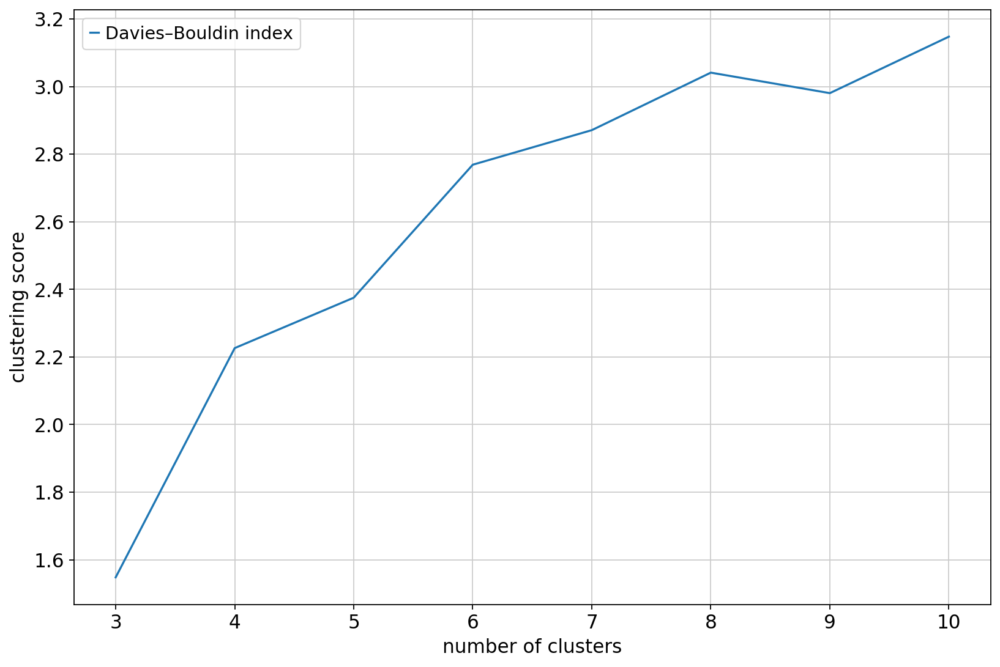

In [44]:
# plot the top value for each cluster

plt.plot(min_db['number_of_clusters'], min_db['davie_bould'])
plt.legend(['Davies–Bouldin index'])
plt.xlabel('number of clusters')
plt.ylabel('clustering score')
plt.show

<function matplotlib.pyplot.show(*args, **kw)>

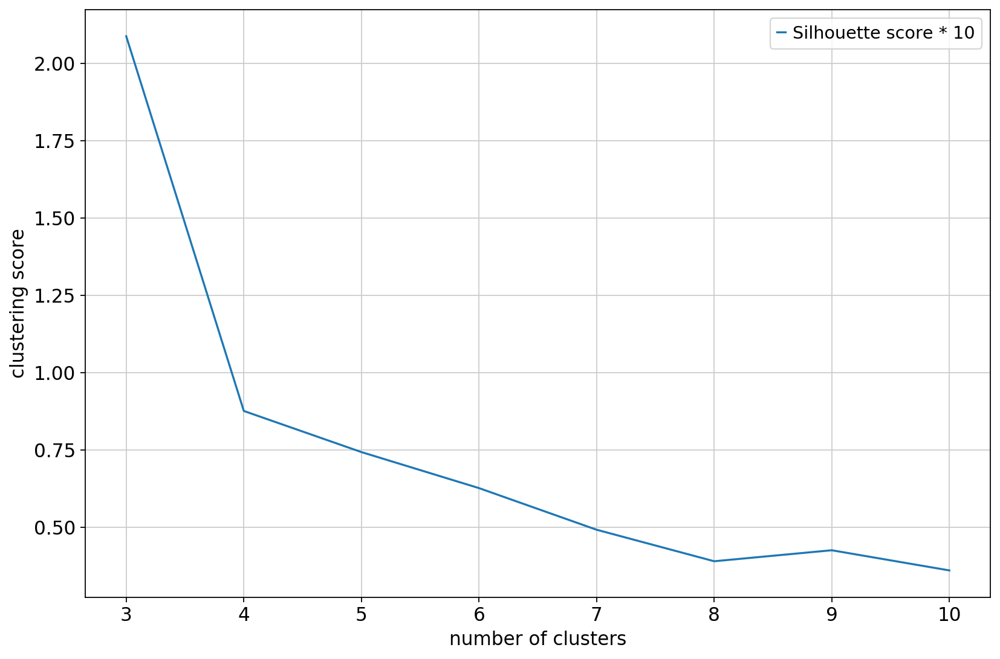

In [45]:
# plot the top value for each cluster

plt.plot(max_sil['number_of_clusters'], max_sil['sil'] * 10)
plt.legend(['Silhouette score * 10'])
plt.xlabel('number of clusters')
plt.ylabel('clustering score')
plt.show

In [46]:
results_df[results_df['number_of_clusters'] == 6].sort_values('sil', ascending=False) 

,KNN,resolution,number_of_clusters,sil,davie_bould
0,20,0.5,6.0,0.062719,2.768932
0,35,0.6,6.0,0.057579,2.978836
0,25,0.6,6.0,0.056441,3.005078
0,5,0.3,6.0,0.055685,2.824376
0,10,0.5,6.0,0.055163,3.044886
0,40,0.6,6.0,0.054697,2.991557
0,30,0.6,6.0,0.049058,3.065677
0,45,0.6,6.0,0.048358,3.097213


In [47]:
results_df[results_df['number_of_clusters'] == 7].sort_values('sil', ascending=False) 

,KNN,resolution,number_of_clusters,sil,davie_bould
0,20,0.6,7.0,0.049270,3.049155
0,40,0.7,7.0,0.048377,2.871176
0,15,0.6,7.0,0.047507,3.123939
0,35,0.8,7.0,0.047337,3.078634
0,5,0.4,7.0,0.043920,2.965316
0,35,0.7,7.0,0.037265,3.297864
0,45,0.7,7.0,0.037102,3.294717
0,10,0.6,7.0,0.035146,3.429183


In [48]:
results_df[results_df['number_of_clusters'] == 8].sort_values('sil', ascending=False) 

,KNN,resolution,number_of_clusters,sil,davie_bould
0,45,0.8,8.0,0.039083,3.185866
0,15,0.7,8.0,0.037894,3.041378
0,30,0.8,8.0,0.036740,3.209382
0,30,0.7,8.0,0.036670,3.237548
0,25,0.7,8.0,0.035673,3.266489


## plot different KNN + resolutions and see how the UMAP graphs actually look like

#### Leiden 7 clusters 20 KNN, 0.6 resolution

In [49]:
plt.rcParams['figure.figsize']=(4,4) #rescale figures

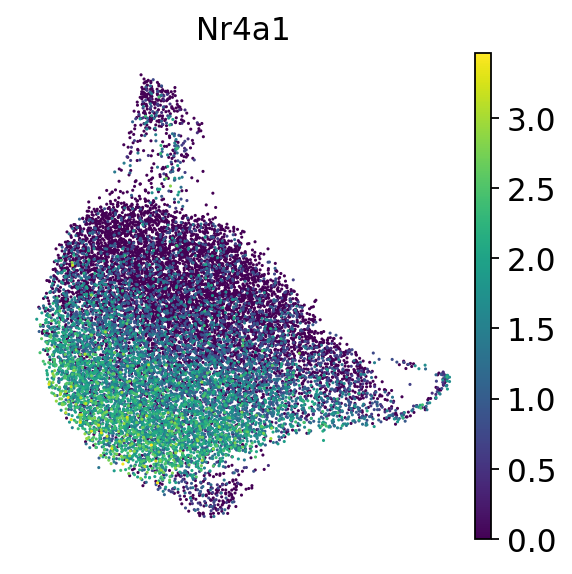

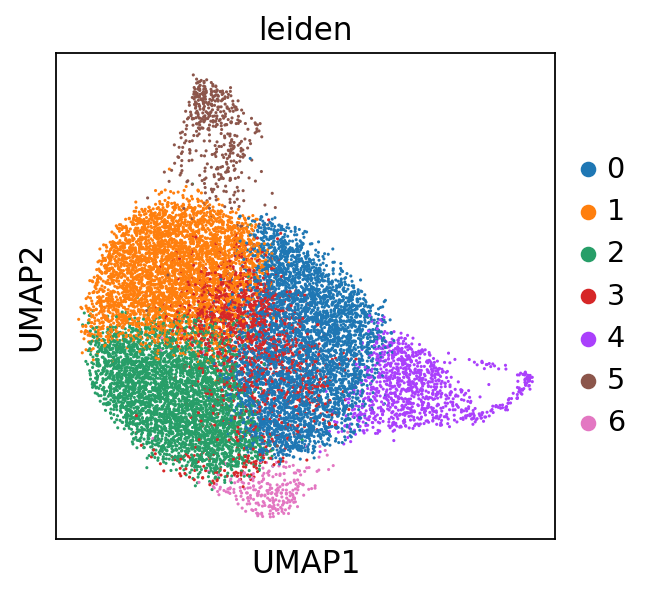

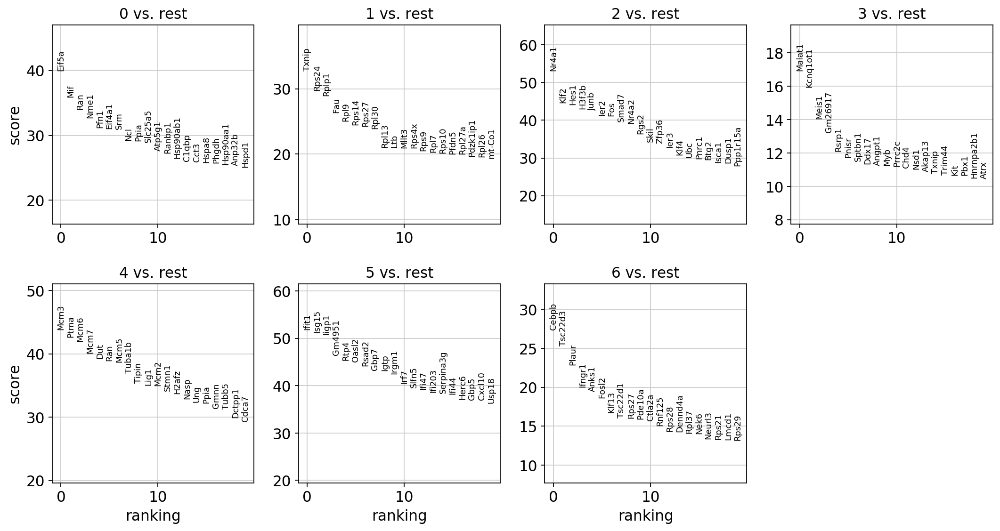

In [50]:
# redo the umap with different neigborhoods

sc.pp.neighbors(adata, n_neighbors=20, n_pcs=40)
sc.tl.umap(adata)
sc.pl.umap(adata, color=['Nr4a1'], legend_loc='on data', frameon=False)
sc.tl.leiden(adata, resolution=0.6)
sc.pl.umap(adata, color=['leiden'])
sc.tl.rank_genes_groups(adata, 'leiden')
sc.pl.rank_genes_groups(adata, n_genes=20, sharey=False)

In [51]:
# Annotate the data sets
print(adata.obs['leiden'].value_counts())
print('')

0    4374
1    3945
2    3738
3    1554
4    1025
5     453
6     266
Name: leiden, dtype: int64



cluster 3 mixed in the middle - hard to see, also cluster 4 is large

#### Leiden 6 clusters 20 KNN, 0.5 resolution - this is the best Silhuette score

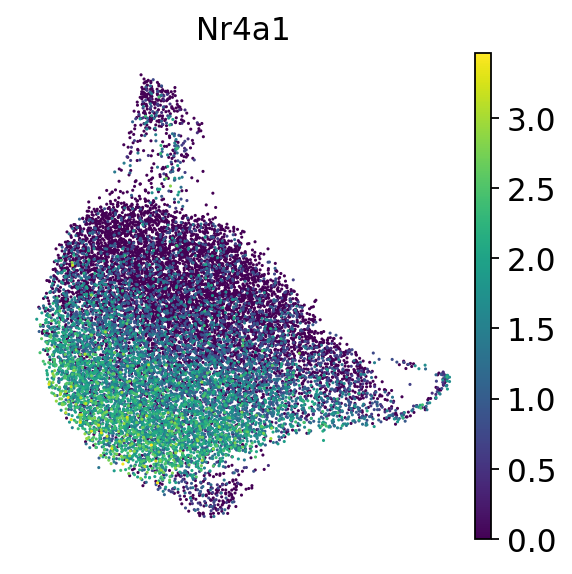

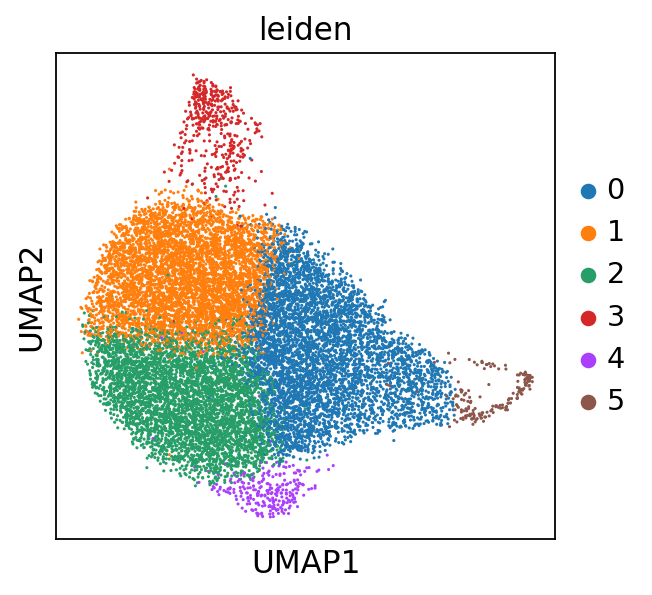

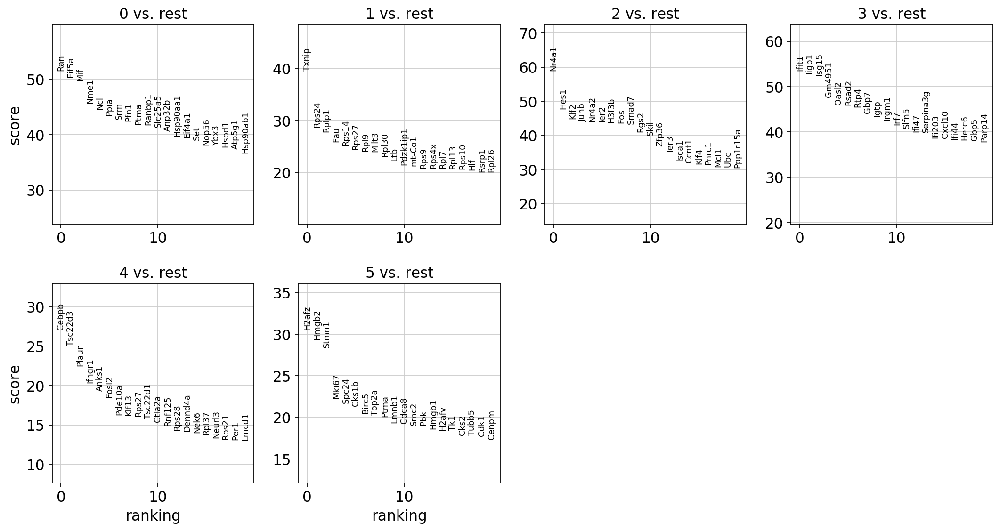

In [52]:
# redo the umap with different neigborhoods

sc.pp.neighbors(adata, n_neighbors=20, n_pcs=40)
sc.tl.umap(adata)
sc.pl.umap(adata, color=['Nr4a1'], legend_loc='on data', frameon=False)
sc.tl.leiden(adata, resolution=0.5)
sc.pl.umap(adata, color=['leiden'])
sc.tl.rank_genes_groups(adata, 'leiden')
sc.pl.rank_genes_groups(adata, n_genes=20, sharey=False)

In [53]:
# Annotate the data sets
print(adata.obs['leiden'].value_counts())
print('')

0    5097
1    4942
2    4449
3     435
4     262
5     170
Name: leiden, dtype: int64



#### this seems to be a reasonable clustering result

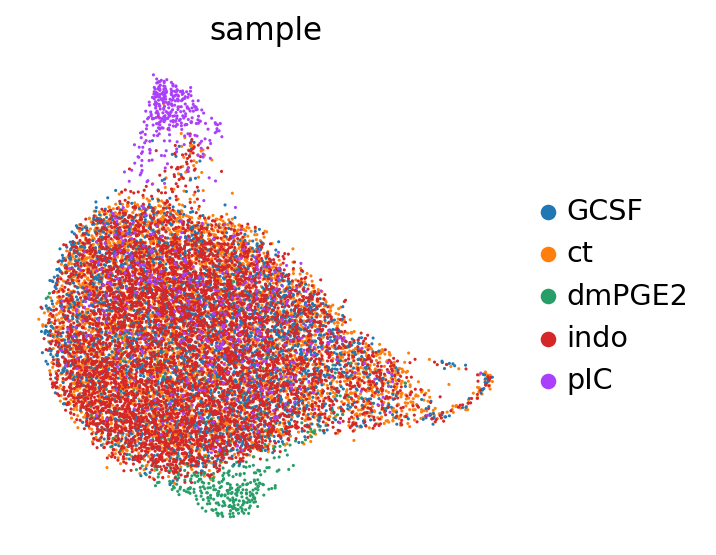

In [54]:
#see how the samples are overlapping

sc.pl.umap(adata, color=['sample'], frameon=False)

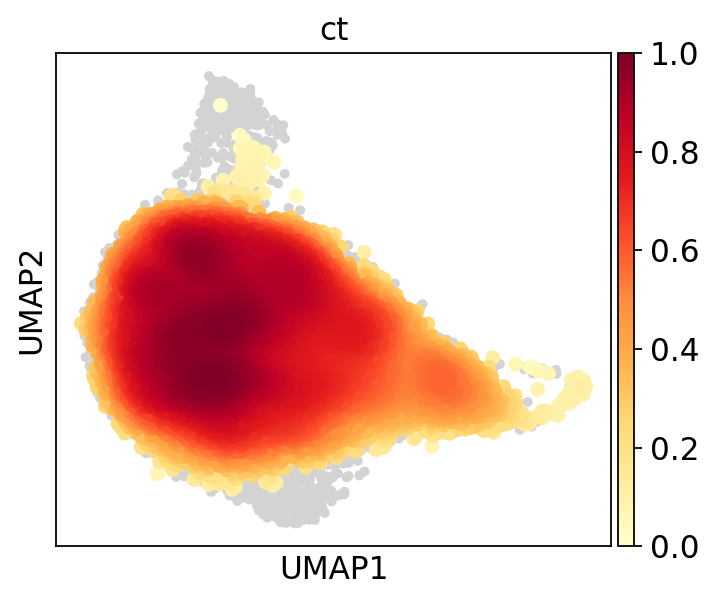

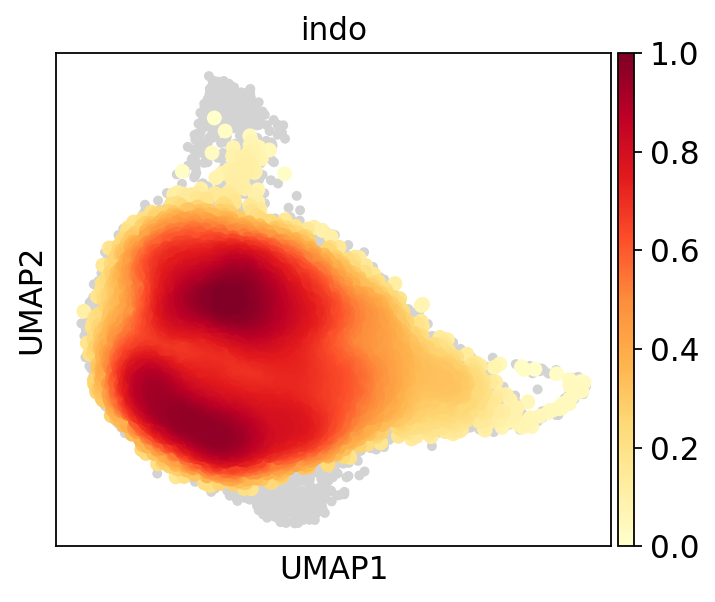

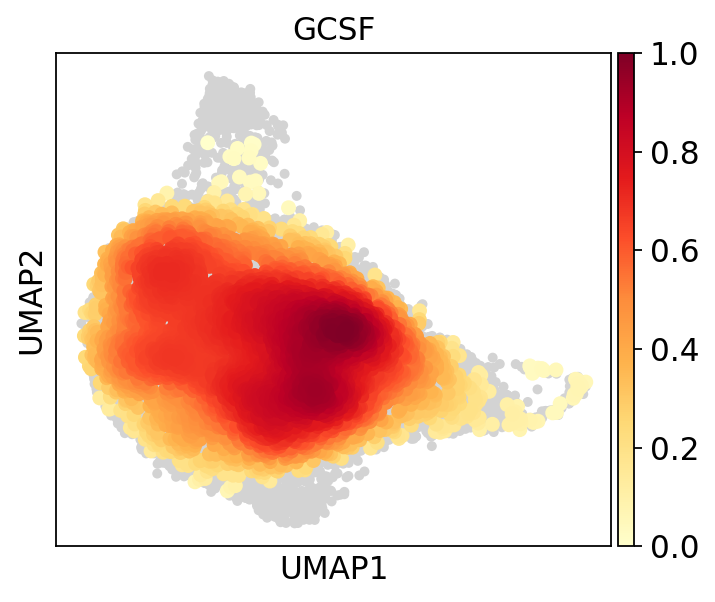

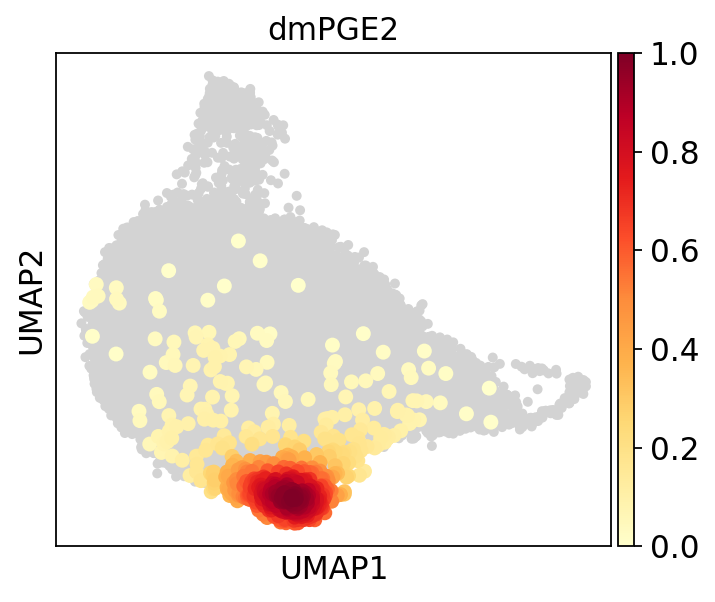

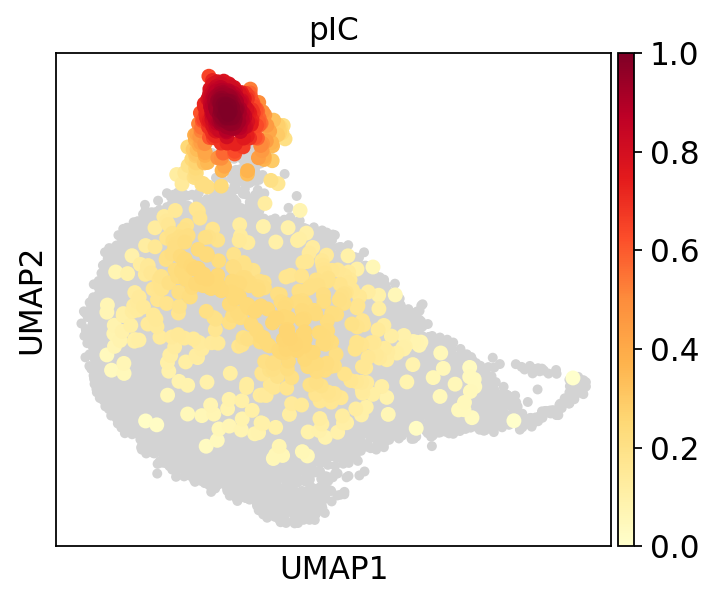

In [55]:
#see where samples localize


import scanpy as sc

#Plot the density
sc.tl.embedding_density(adata, basis='umap', groupby='sample')

adata.obs['sample'].value_counts()
sc.pl.embedding_density(adata, basis='umap', key='umap_density_sample', group='ct')
sc.pl.embedding_density(adata, basis='umap', key='umap_density_sample', group='indo')
sc.pl.embedding_density(adata, basis='umap', key='umap_density_sample', group='GCSF')
sc.pl.embedding_density(adata, basis='umap', key='umap_density_sample', group='dmPGE2')
sc.pl.embedding_density(adata, basis='umap', key='umap_density_sample', group='pIC')

## tried out visualiztion with other dim reduction methods

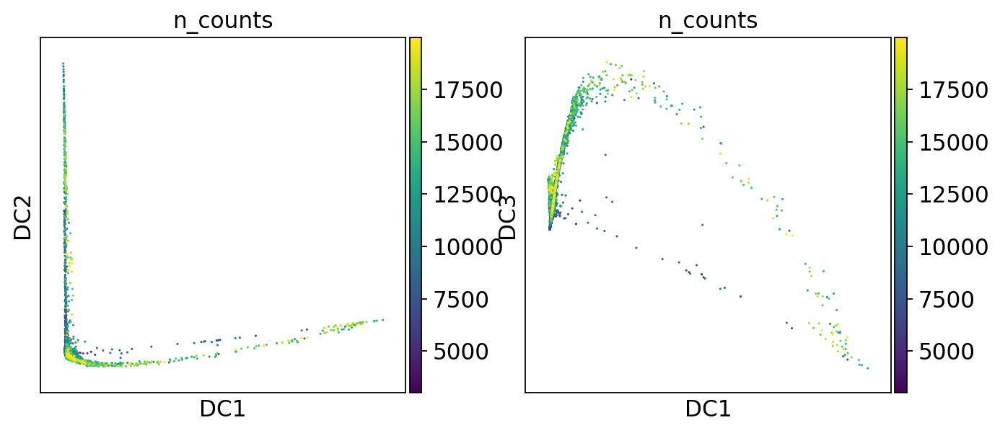

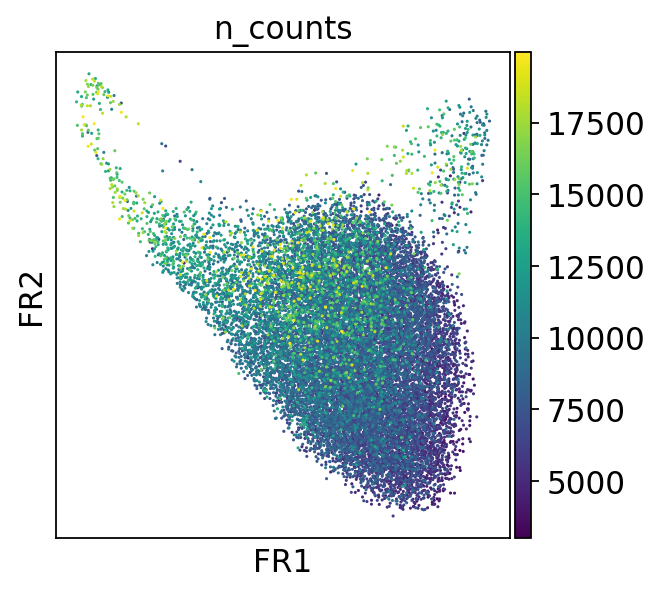

In [56]:
# Calculate and plot other visualizations

sc.tl.diffmap(adata)
sc.tl.draw_graph(adata)

sc.pl.diffmap(adata, color='n_counts', components=['1,2','1,3'])
sc.pl.draw_graph(adata, color='n_counts')

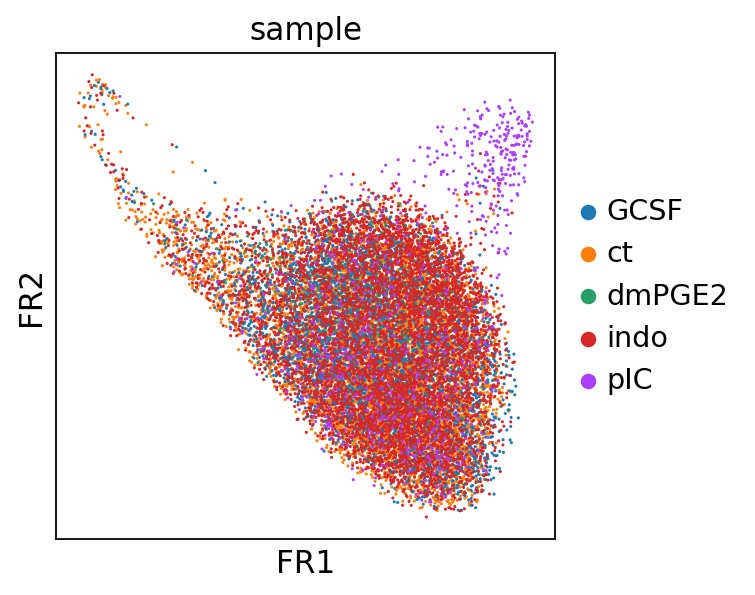

In [57]:
sc.pl.draw_graph(adata, color='sample')

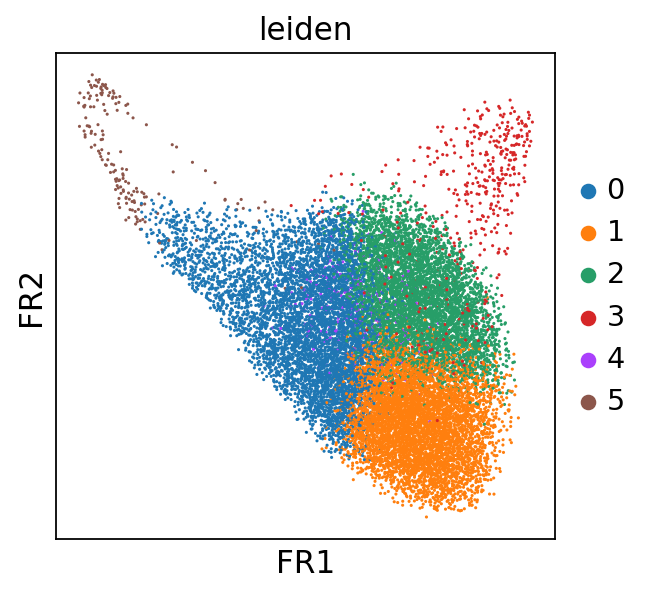

In [58]:
sc.pl.draw_graph(adata, color='leiden')

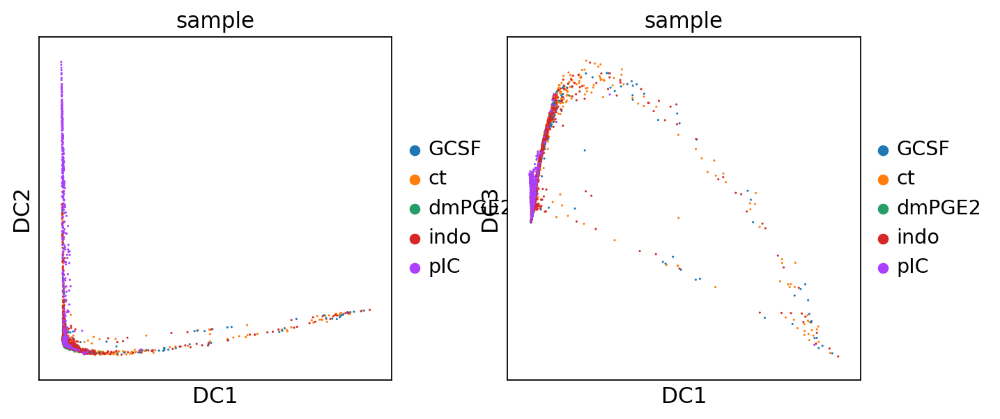

In [59]:
sc.pl.diffmap(adata, color='sample', components=['1,2','1,3'])

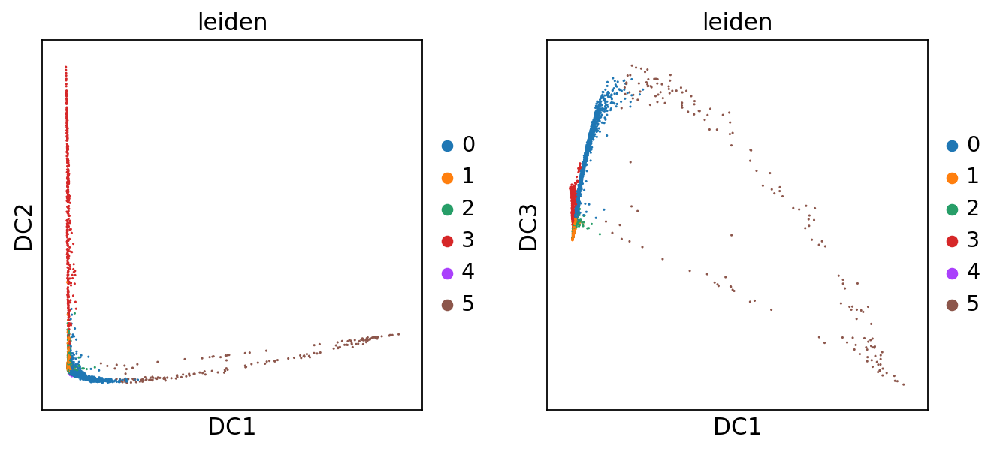

In [60]:
sc.pl.diffmap(adata, color='leiden', components=['1,2','1,3'])

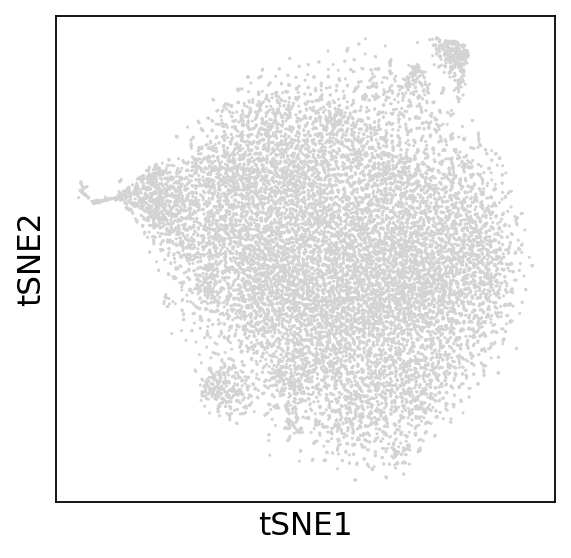

In [61]:
# calculate tsne as well just to be complete!
sc.tl.tsne(adata)
sc.pl.tsne(adata)

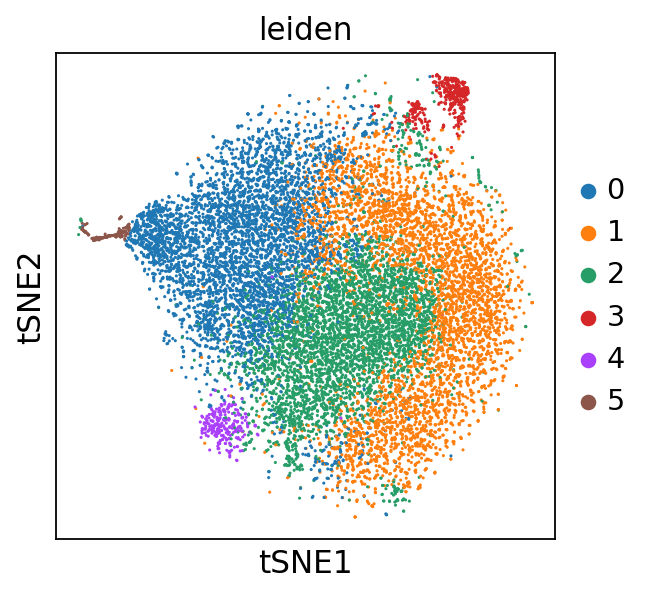

In [62]:
sc.pl.tsne(adata, color='leiden')

### more plots:

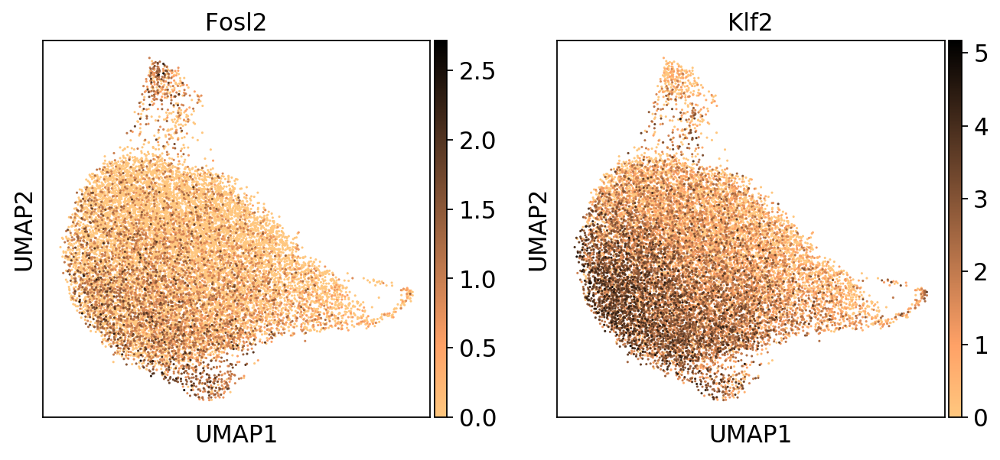

In [63]:
sc.pl.umap(adata, color=['Fosl2', 'Klf2'], cmap = 'copper_r')

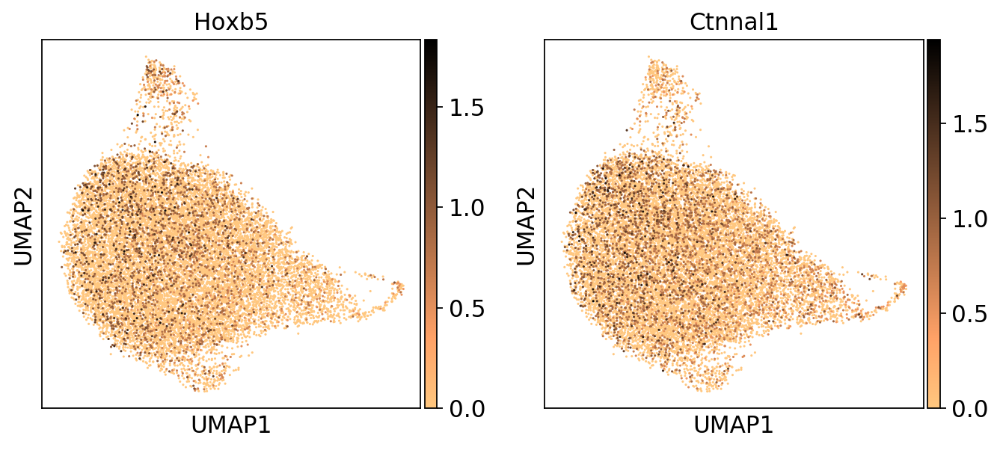

In [64]:
sc.pl.umap(adata, color=['Hoxb5', 'Ctnnal1'], cmap = 'copper_r')

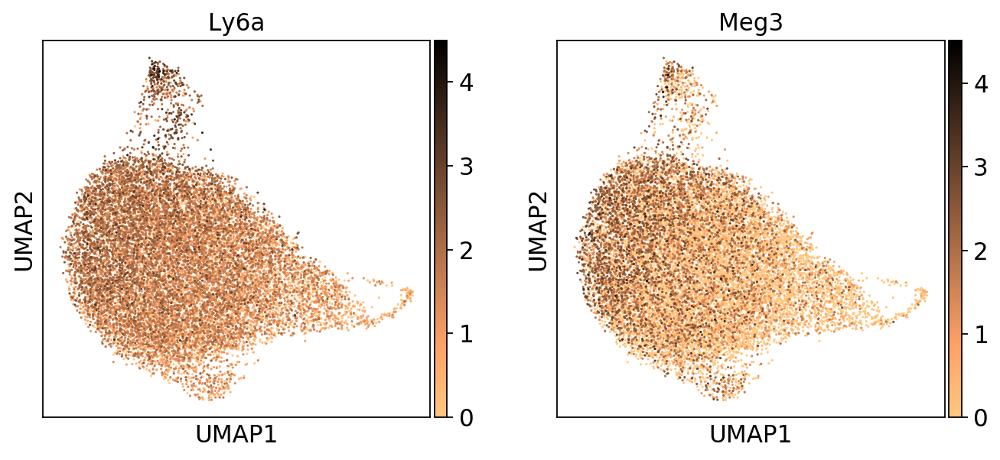

In [65]:
sc.pl.umap(adata, color=['Ly6a', 'Meg3'], cmap = 'copper_r')

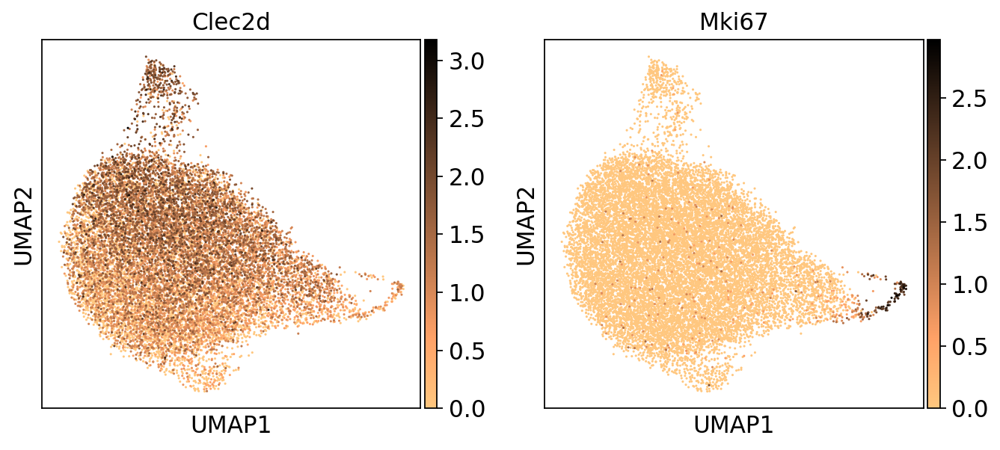

In [66]:
sc.pl.umap(adata, color=['Clec2d', 'Mki67'], cmap = 'copper_r')

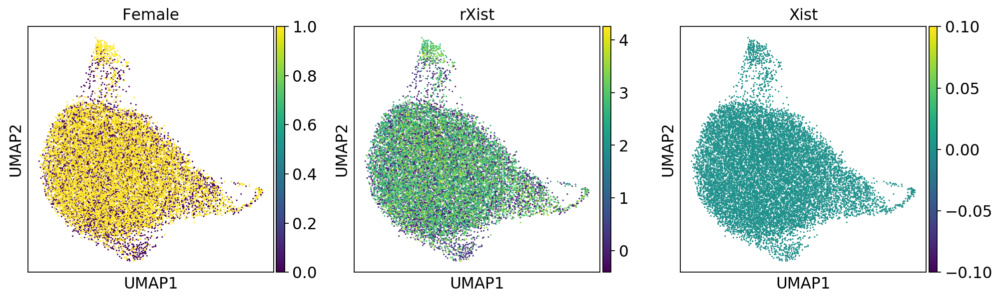

In [67]:
sc.pl.umap(adata, color=['Female', 'rXist', 'Xist'], use_raw=False)

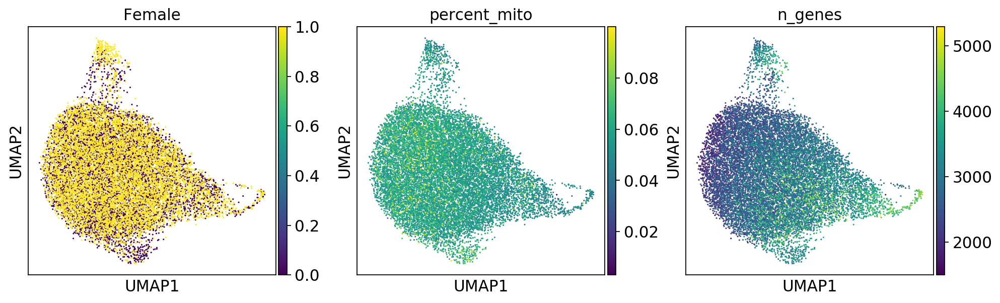

In [68]:
sc.pl.umap(adata, color=['Female', 'percent_mito', 'n_genes'])

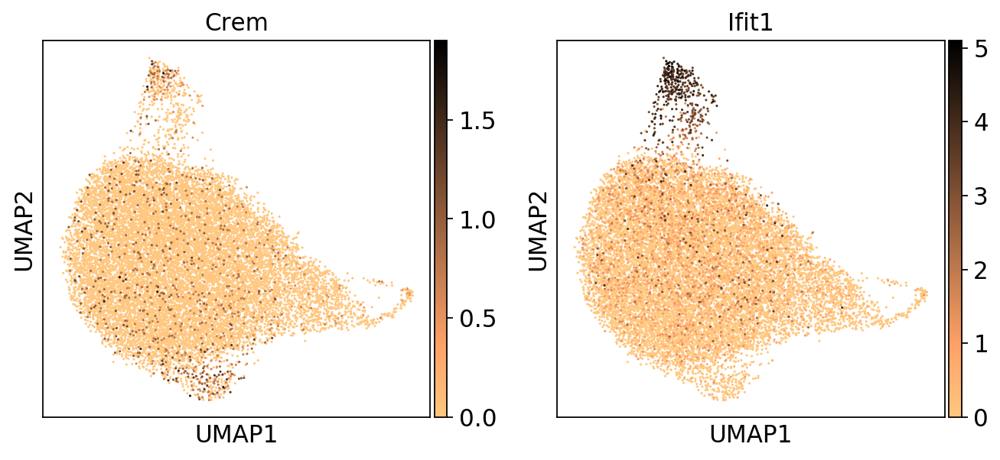

In [69]:
sc.pl.umap(adata, color=['Crem','Ifit1'], cmap='copper_r')

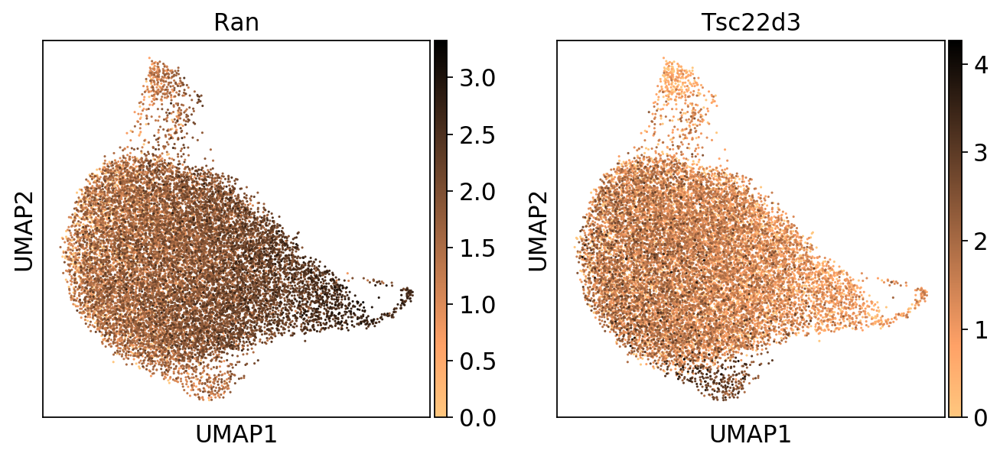

In [70]:
sc.pl.umap(adata, color=['Ran','Tsc22d3'], cmap='copper_r')

In [71]:
# have to delete that otherwise there is a bug in the saving to .h5ad
adata.uns['rank_genes_groups'] = None
adata.uns['rank_genes'] = None

In [74]:
# write the file to disk
adata.write('./sc_objects/LT_preprocessed.h5ad')

Looks good after combat batch processing - PGE2 is still a separate population so need to do other batch correction approaches and see if that is similar

In [75]:
sc.logging.print_versions()
pd.show_versions()

scanpy==1.4.5.1 anndata==0.7.1 umap==0.3.10 numpy==1.17.3 scipy==1.3.0 pandas==0.25.3 scikit-learn==0.21.3 statsmodels==0.10.0 python-igraph==0.7.1 louvain==0.6.1.post1

INSTALLED VERSIONS
------------------
commit           : None
python           : 3.7.3.final.0
python-bits      : 64
OS               : Linux
OS-release       : 4.19.76-linuxkit
machine          : x86_64
processor        : x86_64
byteorder        : little
LC_ALL           : en_US.UTF-8
LANG             : en_US.UTF-8
LOCALE           : en_US.UTF-8

pandas           : 0.25.3
numpy            : 1.17.3
pytz             : 2019.3
dateutil         : 2.8.1
pip              : 19.3.1
setuptools       : 41.6.0.post20191101
Cython           : 0.29.14
pytest           : None
hypothesis       : None
sphinx           : None
blosc            : None
feather          : None
xlsxwriter       : 1.2.8
lxml.etree       : None
html5lib         : None
pymysql          : None
psycopg2         : None
jinja2           : 2.10.3
IPython          :